# Introduction

# The Business Challenge

**Key points to understand a data science problem:**

- What is the motivation? What is the context behind?
- What is the root cause? Why does the business team need a forecast?
- Who is the Stakeholder?
- What is the expected solution format?

In this case, the key point of the problem are:

- **Request:** the CFO requested this solution to the business team in a management meeting;
- **The root cause:** the CFO aims to reform the stores. However, it is extremely hard to determine the reform budget for each store;
- **The Stakeholder:** The CFO is the Stakeholder;
- Solution Format:
  - **Granularity:** Daily sales forecast (in R$) per store for the next 6 weeks;
  - **Problem Type:** Sales forecast;
  - **Potential Methods:** Time Series, Regression, Neural Networks;
  - **Output Shape:** Sales forecast displayed in a smartphone.

The above-mentioned key points show that there is relevant content behind the 6 weeks sales forecast request: the final goal is to reform the stores. However, it is not possible to set a budget for that without knowing the revenue for the period: it is a risk, for example, if the reform budget exceeds the total amount of sales, that is, pratical there would not be enough money to finish the reform.

# 0.0. Imports

In [1]:
# import the relevant libraries

# data manipulation
import pandas as pd
import numpy as np

# statistics
from scipy import stats

# graphs
import matplotlib.pyplot as plt
import seaborn as sns

# load images
from IPython.display import Image

# warning
import warnings
warnings.filterwarnings( 'ignore' )

# Scalers
from sklearn.preprocessing import MinMaxScaler, RobustScaler

# save files
import pickle

# Machine Learning models
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from xgboost import XGBClassifier, XGBRegressor

# models' cross-validation
from sklearn.model_selection import cross_validate, cross_val_score, cross_val_predict, RandomizedSearchCV

# models' metrics
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score,\
confusion_matrix, matthews_corrcoef, make_scorer, roc_curve

## 0.1. Helper Functions

In [2]:
# Model's performance function
def performance(model, x_train, y_train):
    # define scoring metrics
    scoring = {'accuracy': 'accuracy',
               'precision': make_scorer(precision_score),
               'recall': make_scorer(recall_score),
               'f1_score': make_scorer(f1_score),
               'roc_auc_score': make_scorer(roc_auc_score),
               'mcc': make_scorer(matthews_corrcoef)}

    # calculate scores with cross_validate
    scores = cross_validate(model, x_train, y_train, cv=10, scoring=scoring)

    # performance data frame
    performance = pd.DataFrame.from_dict(scores).drop(['fit_time', 'score_time'], axis=1)
    performance = pd.DataFrame(performance.mean()).T
    return performance

In [3]:
# Removing outliers function
def drop_outliers(var: str, dataset: pd.DataFrame):

    # find Q1, Q3 e IQR
    Q1 = np.quantile(dataset[var], .25)
    Q3 = np.quantile(dataset[var], .75)
    IQR = Q3 - Q1

    # calculates the outliers boundaries through statistical relationship
    low = Q1 - 1.5 * IQR
    high = Q3 + 1.5 * IQR

    dados_resultado = dataset.loc[(dataset[var] > low) & (dataset[var] < high)]
    return dados_resultado

In [4]:
# Ploting Relashionship
def relashionship_h(dataset: pd.DataFrame, var1: str, var2: str):
    h = dataset[[var1,var2]].groupby(var2).sum().reset_index()
    h_mean = dataset.groupby(var2)[var1].mean().reset_index()

    f, ax = plt.subplots(3, 1,figsize=(16, 6))
    sns.scatterplot(data=h, y=var1, x=var2, ax=ax[0], color='g', alpha=0.8)
    ax[0].set_title(f'Sum of {var1} x {var2}')
    sns.barplot(data=h_mean, y=var1, x=var2, ax=ax[1])
    ax[1].set_title(f'Mean of {var1} x {var2}')
    sns.heatmap(data=h.corr(method='pearson'), annot=True)
    plt.subplots_adjust(hspace=0.5)
    return plt.show()

# 1.0. Data

## 1.1. Load the Data

In [5]:
# Importing dataset using pandas
df = pd.read_csv('data.csv')
df.head()

,valence,year,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo
0,0.0594,1921,0.982,"['Sergei Rachmaninoff', 'James Levine', 'Berli...",0.279,831667,0.211,0,4BJqT0PrAfrxzMOxytFOIz,0.878000,10,0.665,-20.096,1,"Piano Concerto No. 3 in D Minor, Op. 30: III. ...",4,1921,0.0366,80.954
1,0.9630,1921,0.732,['Dennis Day'],0.819,180533,0.341,0,7xPhfUan2yNtyFG0cUWkt8,0.000000,7,0.160,-12.441,1,Clancy Lowered the Boom,5,1921,0.4150,60.936
2,0.0394,1921,0.961,['KHP Kridhamardawa Karaton Ngayogyakarta Hadi...,0.328,500062,0.166,0,1o6I8BglA6ylDMrIELygv1,0.913000,3,0.101,-14.850,1,Gati Bali,5,1921,0.0339,110.339
3,0.1650,1921,0.967,['Frank Parker'],0.275,210000,0.309,0,3ftBPsC5vPBKxYSee08FDH,0.000028,5,0.381,-9.316,1,Danny Boy,3,1921,0.0354,100.109
4,0.2530,1921,0.957,['Phil Regan'],0.418,166693,0.193,0,4d6HGyGT8e121BsdKmw9v6,0.000002,3,0.229,-10.096,1,When Irish Eyes Are Smiling,2,1921,0.0380,101.665


In [6]:
df_genrer = pd.read_csv('data_w_genres.csv')
df_genrer.genres.unique()

array(["['show tunes']", '[]', "['comedy rock', 'comic', 'parody']", ...,
       "['mainland chinese pop', 'zhongguo feng']",
       "['c-pop', 'classic mandopop', 'mainland chinese pop', 'mandopop']",
       "['chinese indie', 'chinese indie rock']"], dtype=object)

In [7]:
df.tail()

,valence,year,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo
170648,0.608,2020,0.08460,"['Anuel AA', 'Daddy Yankee', 'KAROL G', 'Ozuna...",0.786,301714,0.808,0,0KkIkfsLEJbrcIhYsCL7L5,0.000289,7,0.0822,-3.702,1,China,72,2020-05-29,0.0881,105.029
170649,0.734,2020,0.20600,['Ashnikko'],0.717,150654,0.753,0,0OStKKAuXlxA0fMH54Qs6E,0.000000,7,0.1010,-6.020,1,Halloweenie III: Seven Days,68,2020-10-23,0.0605,137.936
170650,0.637,2020,0.10100,['MAMAMOO'],0.634,211280,0.858,0,4BZXVFYCb76Q0Klojq4piV,0.000009,4,0.2580,-2.226,0,AYA,76,2020-11-03,0.0809,91.688
170651,0.195,2020,0.00998,['Eminem'],0.671,337147,0.623,1,5SiZJoLXp3WOl3J4C8IK0d,0.000008,2,0.6430,-7.161,1,Darkness,70,2020-01-17,0.3080,75.055
170652,0.642,2020,0.13200,"['KEVVO', 'J Balvin']",0.856,189507,0.721,1,7HmnJHfs0BkFzX4x8j0hkl,0.004710,7,0.1820,-4.928,1,Billetes Azules (with J Balvin),74,2020-10-16,0.1080,94.991


## 1.2. Columns Description

In [8]:
df.columns

Index(['valence', 'year', 'acousticness', 'artists', 'danceability',
       'duration_ms', 'energy', 'explicit', 'id', 'instrumentalness', 'key',
       'liveness', 'loudness', 'mode', 'name', 'popularity', 'release_date',
       'speechiness', 'tempo'],
      dtype='object')

**Features:**

  *Numerical:*

  - **Acousticness** (Ranges from 0 to 1): The relative metric of the track being acoustic. 1.0 represents high confidence the track is acoustic
  - **Danceability** (Ranges from 0 to 1): The relative measurement of the track being danceable. Danceability describes how suitable a track is for dancing based on a combination of musical elements including tempo, rhythm stability, beat strength, and overall regularity. A value of 0.0 is least danceable and 1.0 is most danceable
  - **Energy** (Ranges from 0 to 1): The energy of the track. Energy is a measure from 0.0 to 1.0 and represents a perceptual measure of intensity and activity. Typically, energetic tracks feel fast, loud, and noisy. For example, death metal has high energy, while a Bach prelude scores low on the scale. Perceptual features contributing to this attribute include dynamic range, perceived loudness, timbre, onset rate, and general entropy
  - **duration_ms** (Integer typically ranging from 200k to 300k): The length of the track in milliseconds (ms)
  - **instrumentalness** (Ranges from 0 to 1): The relative ratio of the track being instrumental. Predicts whether a track contains no vocals. “Ooh” and “aah” sounds are treated as instrumental in this context. Rap or spoken word tracks are clearly “vocal”. The closer the instrumentalness value is to 1.0, the greater likelihood the track contains no vocal content. Values above 0.5 are intended to represent instrumental tracks, but confidence is higher as the value approaches 1.0
  - **valence** (Ranges from 0 to 1): A measure from 0.0 to 1.0 describing the musical positiveness conveyed by a track. Tracks with high valence sound more positive (e.g. happy, cheerful, euphoric), while tracks with low valence sound more negative (e.g. sad, depressed, angry)
  - **popularity** (Ranges from 0 to 100)
  - **tempo** (Float typically ranging from 50 to 150): The overall estimated tempo of a track in beats per minute (BPM). In musical terminology, tempo is the speed or pace of a given piece and derives directly from the average beat duration
  - **liveness** (Ranges from 0 to 1): Detects the presence of an audience in the recording. Higher liveness values represent an increased probability that the track was performed live. A value above 0.8 provides strong likelihood that the track is live
  - **loudness** (Float typically ranging from -60 to 0): The overall loudness of a track in decibels (dB). Loudness values are averaged across the entire track and are useful for comparing relative loudness of tracks. Loudness is the quality of a sound that is the primary psychological correlate of physical strength (amplitude). Values typical range between -60 and 0 db
  - **speechiness** (Ranges from 0 to 1): Speechiness detects the presence of spoken words in a track. The more exclusively speech-like the recording (e.g. talk show, audio book, poetry), the closer to 1.0 the attribute value. Values above 0.66 describe tracks that are probably made entirely of spoken words. Values between 0.33 and 0.66 describe tracks that may contain both music and speech, either in sections or layered, including such cases as rap music. Values below 0.33 most likely represent music and other non-speech-like tracks
  - year (Ranges from 1921 to 2020)

*Dummy:*

  - **mode** (0 = Minor, 1 = Major): Mode indicates the modality (major or minor) of a track, the type of scale from which its melodic content is derived. Major is represented by 1 and minor is 0
  - **explicit** (0 = No explicit content, 1 = Explicit content): Whether or not the track has explicit lyrics ( true = yes it does; false = no it does not OR unknown)

*Categorical:*

  - **key** (All keys on octave encoded as values ranging from 0 to 11, starting on C as 0, C# as 1 and so on…)
  - **artists** (List of artists mentioned)
  - **release_date** (Date of release mostly in yyyy-mm-dd format, however precision of date may vary)
  - **name** (Name of the song)

### 1.2.1. Rename Columns

It is not necessary to change columns name.

## 1.3. Data Dimension

In [9]:
print(f'The dimension of data is: {df.shape}.')
print(f'Number of rows: 170653.')
print(f'Number of columns: 19.')

The dimension of data is: (170653, 19).
Number of rows: 170653.
Number of columns: 19.


## 1.4. Data Types and Structure

In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 170653 entries, 0 to 170652
Data columns (total 19 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   valence           170653 non-null  float64
 1   year              170653 non-null  int64  
 2   acousticness      170653 non-null  float64
 3   artists           170653 non-null  object 
 4   danceability      170653 non-null  float64
 5   duration_ms       170653 non-null  int64  
 6   energy            170653 non-null  float64
 7   explicit          170653 non-null  int64  
 8   id                170653 non-null  object 
 9   instrumentalness  170653 non-null  float64
 10  key               170653 non-null  int64  
 11  liveness          170653 non-null  float64
 12  loudness          170653 non-null  float64
 13  mode              170653 non-null  int64  
 14  name              170653 non-null  object 
 15  popularity        170653 non-null  int64  
 16  release_date      17

* No Null Values
* The dataset has 3 types: float64(9), int64(6) and object(4)

## 1.5. Change Data Types
It is not necessary to change data types.

## 1.6. Descriptive Statistics

1.6.1. Numerical Atrributes

In [11]:
# Select numerical attributes
num_attr = df.select_dtypes(include=['int64', 'float64'])
num_attr.describe()

,valence,year,acousticness,danceability,duration_ms,energy,explicit,instrumentalness,key,liveness,loudness,mode,popularity,speechiness,tempo
count,170653.000000,170653.000000,170653.000000,170653.000000,1.706530e+05,170653.000000,170653.000000,170653.000000,170653.000000,170653.000000,170653.000000,170653.000000,170653.000000,170653.000000,170653.000000
mean,0.528587,1976.787241,0.502115,0.537396,2.309483e+05,0.482389,0.084575,0.167010,5.199844,0.205839,-11.467990,0.706902,31.431794,0.098393,116.861590
std,0.263171,25.917853,0.376032,0.176138,1.261184e+05,0.267646,0.278249,0.313475,3.515094,0.174805,5.697943,0.455184,21.826615,0.162740,30.708533
min,0.000000,1921.000000,0.000000,0.000000,5.108000e+03,0.000000,0.000000,0.000000,0.000000,0.000000,-60.000000,0.000000,0.000000,0.000000,0.000000
25%,0.317000,1956.000000,0.102000,0.415000,1.698270e+05,0.255000,0.000000,0.000000,2.000000,0.098800,-14.615000,0.000000,11.000000,0.034900,93.421000
50%,0.540000,1977.000000,0.516000,0.548000,2.074670e+05,0.471000,0.000000,0.000216,5.000000,0.136000,-10.580000,1.000000,33.000000,0.045000,114.729000
75%,0.747000,1999.000000,0.893000,0.668000,2.624000e+05,0.703000,0.000000,0.102000,8.000000,0.261000,-7.183000,1.000000,48.000000,0.075600,135.537000
max,1.000000,2020.000000,0.996000,0.988000,5.403500e+06,1.000000,1.000000,1.000000,11.000000,1.000000,3.855000,1.000000,100.000000,0.970000,243.507000


1.6.2. Categorical Attributes

In [12]:
cat_attr = df.select_dtypes(exclude=['float64', 'int64'])
cat_attr.describe()

,artists,id,name,release_date
count,170653,170653,170653,170653
unique,34088,170653,133638,11244
top,['Эрнест Хемингуэй'],36eYYJgy181zqtsXItTMeZ,White Christmas,1945
freq,1211,1,73,1446


These columns will not be used

# 2.0. Feature Engineering

In [13]:
# Duration in minutes
df['duration_min'] = df.duration_ms / (60*1000)

df.head()

,valence,year,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo,duration_min
0,0.0594,1921,0.982,"['Sergei Rachmaninoff', 'James Levine', 'Berli...",0.279,831667,0.211,0,4BJqT0PrAfrxzMOxytFOIz,0.878000,10,0.665,-20.096,1,"Piano Concerto No. 3 in D Minor, Op. 30: III. ...",4,1921,0.0366,80.954,13.861117
1,0.9630,1921,0.732,['Dennis Day'],0.819,180533,0.341,0,7xPhfUan2yNtyFG0cUWkt8,0.000000,7,0.160,-12.441,1,Clancy Lowered the Boom,5,1921,0.4150,60.936,3.008883
2,0.0394,1921,0.961,['KHP Kridhamardawa Karaton Ngayogyakarta Hadi...,0.328,500062,0.166,0,1o6I8BglA6ylDMrIELygv1,0.913000,3,0.101,-14.850,1,Gati Bali,5,1921,0.0339,110.339,8.334367
3,0.1650,1921,0.967,['Frank Parker'],0.275,210000,0.309,0,3ftBPsC5vPBKxYSee08FDH,0.000028,5,0.381,-9.316,1,Danny Boy,3,1921,0.0354,100.109,3.500000
4,0.2530,1921,0.957,['Phil Regan'],0.418,166693,0.193,0,4d6HGyGT8e121BsdKmw9v6,0.000002,3,0.229,-10.096,1,When Irish Eyes Are Smiling,2,1921,0.0380,101.665,2.778217


## 2.1. Mind Map

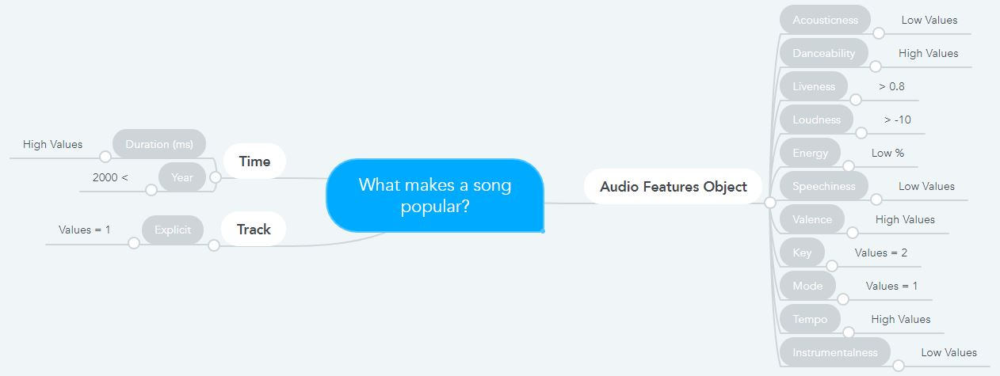

In [14]:
Image('img/mindset.jpg')

## 2.2. Hypothesis Creation

### 2.2.1. Audio Feature Object
1. Popularity occour with high `acousticness`.
2. Popularity occour with high `danceability`.
3. Popularity occour with 80% of `liveness`.
4. Popularity occour with `loudness` above -10.
5. Popularity occour with low `energy`.
6. Popularity occour with low `speechiness`.
7. Popularity occour with high `valence`.
8. Popularity occour with `key` equal 2.
9. Popularity occour with `mode` equal 1.
10. Popularity occour with high `tempo`.
11. Popularity occour with low `instrumentalness`.

### 2.2.2. Track
1. Popularity occour with `explicit` equal 1.

### 2.2.3. Time
1. Popularity occour with high `duration_min`.

# 3.0. Variables Filtering

In [15]:
df2 = df

## 3.1. Removing outliers

In [16]:
columns_outline = 'duration_ms'
df3 = df2[df2.duration_ms < 2e6]
df3.shape

# Dataset without duration outliers
df_no_out = drop_outliers('duration_ms', df)

# 4.0. Exploratory Data Analysis

In [17]:
# Checkpoint 1 
df3.to_csv('dataset/df3.csv')

## 4.1. Univariate Analysis
The univariate analysis explores the variable itself, so that can be checked the variable frequency, distribution, range. Etc.


### 4.1.1. Target Variable
Target Variable Popularity: It is calculated by an algorithm and based on how many times a track has been played and how recent those plays are.

The popularity of a track is a value between 0 and 100, with 100 being the most popular. The popularity is calculated by algorithm and is based, in the most part, on the total number of plays the track has had and how recent those plays are.
Generally speaking, songs that are being played a lot now will have a higher popularity than songs that were played a lot in the past. Duplicate tracks (e.g. the same track from a single and an album) are rated independently. Artist and album popularity is derived mathematically from track popularity. Note that the popularity value may lag actual popularity by a few days: the value is not updated in real time.


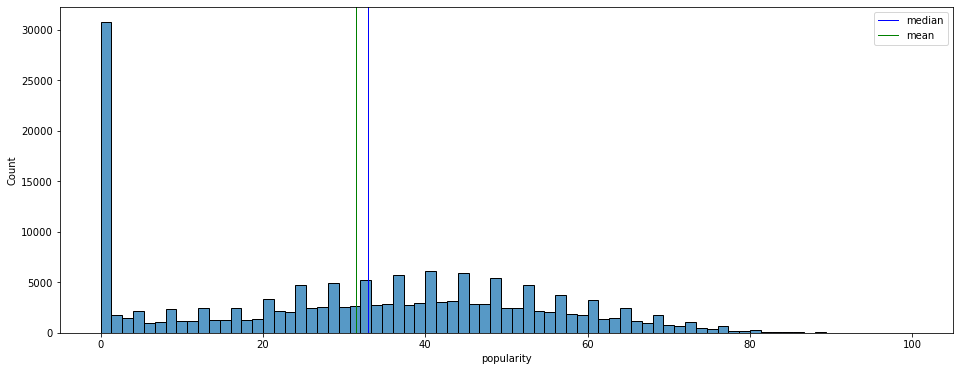

In [18]:
# Loading Checkpoint 1
df3 = pd.read_csv('dataset/df3.csv').drop(['Unnamed: 0', 'duration_ms'], axis=1)

df3_numerical = df3.select_dtypes(include=['int64', 'float64'])

# Median and Mean
pop_mean = df3_numerical.popularity.mean()
pop_median = df3_numerical.popularity.median()

# Plot target variable
plt.figure(figsize=(16, 6))
sns.histplot(df3_numerical.popularity)
plt.axvline(pop_median, color = 'b', linewidth = 1, label = 'median')
plt.axvline(pop_mean, color='g', linewidth = 1, label = 'mean')
plt.legend()
plt.show()

* Most of the songs do not have good popularity score.
* Popularity has a bimodal distribution.

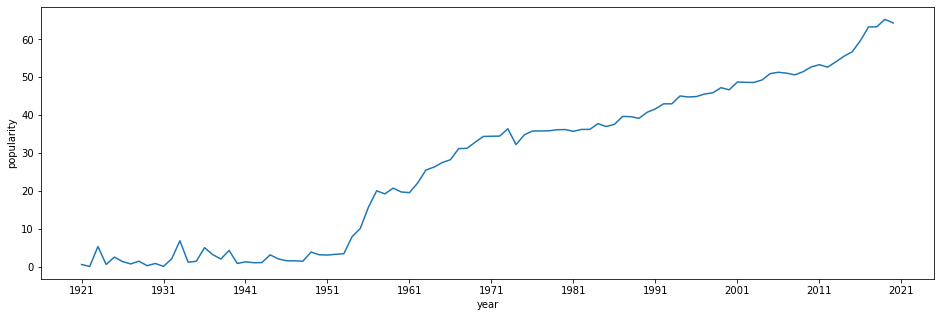

In [19]:
# Plot target variable by year
plt.figure(figsize=(16, 5))
sns.lineplot(data=df3_numerical, x='year', y='popularity', ci=None)
plt.xticks(np.arange(1921, 2022, 10))

plt.show()

* About 0 popularity: This means all songs related to an artist are 0-popular. 
* These songs are songs from 1920s or maybe older. 
* It has anything to do with the popularity measurement system, not the dataset itself.

## 4.2. Numerical Variables Distribution

<Figure size 1152x576 with 0 Axes>

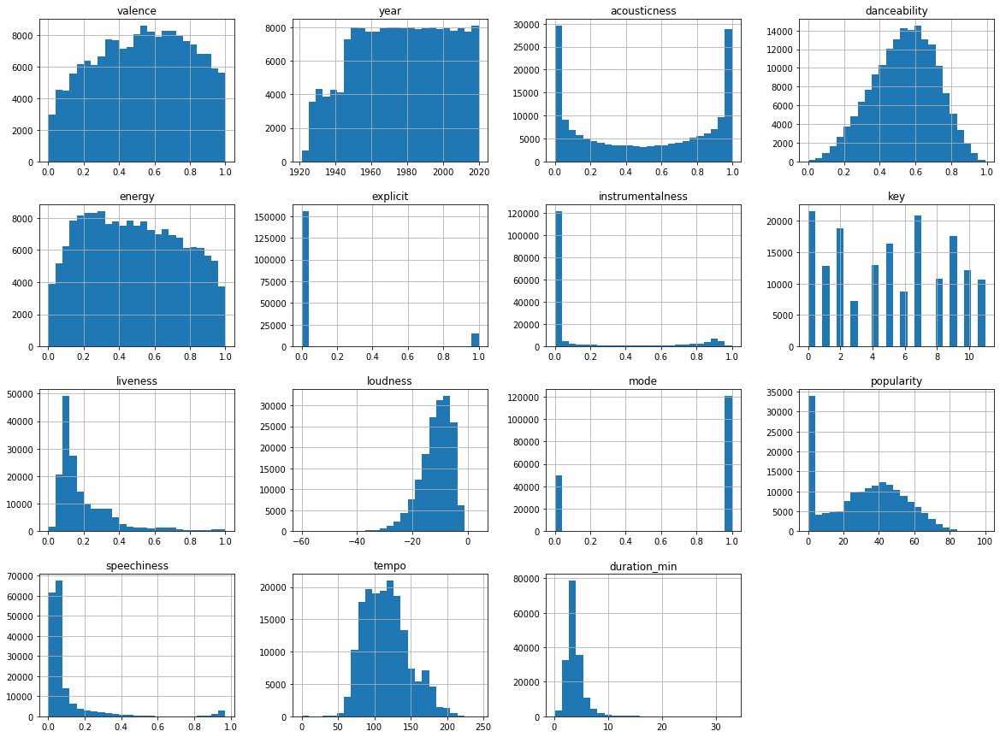

In [20]:
# Ploting numerical 
plt.figure(figsize=(16,8))
df3_numerical.hist(bins=25, figsize=(20,15))
plt.show()

**Analysis**
* `loudness` has negative values and left skew
* `liveness`, `speechiness` and `duration_min` is right skew
* `loudness` has negative skew
* `tempo` has a unimodal distribution
* `acousticness` is a bimodal dataset


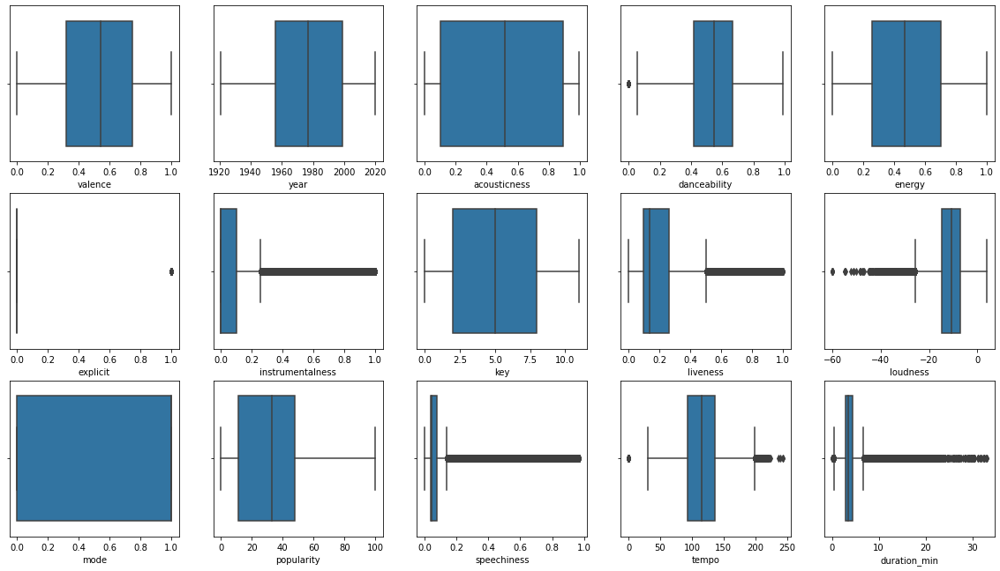

In [21]:
# Checking outliers
plt.figure(figsize=(20, 15))

for i in range(len(df3_numerical.columns)):
    plt.subplot(4, 5, i + 1)
    sns.boxplot(df3_numerical[df3_numerical.columns[i]])

plt.show()

## 4.3. Categorical Variables Distribution

### 4.3.1. Artists of the moment

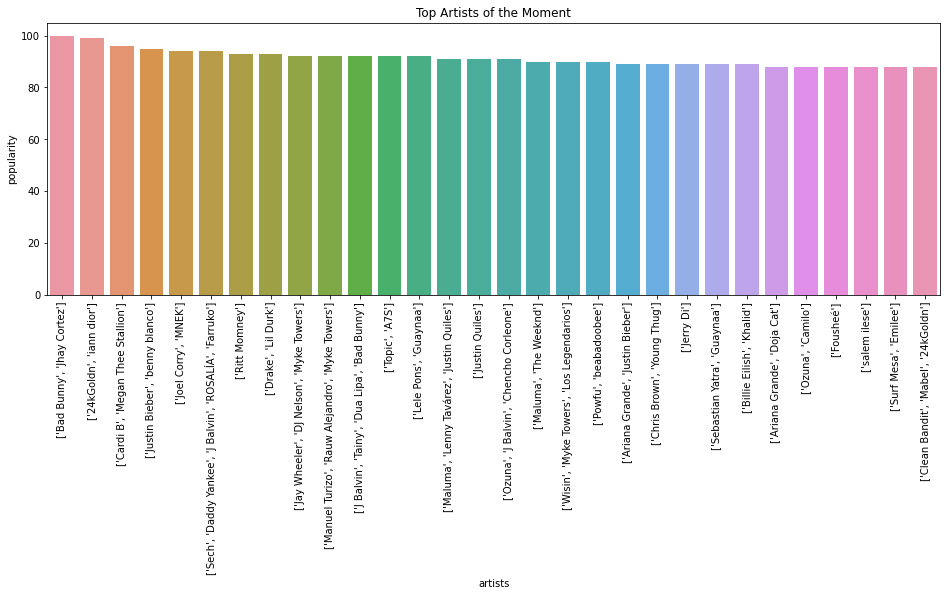

In [22]:
# Dataset with actual top artists
top_hit_artists = df3.groupby('artists')[['popularity']].mean().reset_index()
top_hit_artists = top_hit_artists.sort_values(by='popularity', ascending=False).head(30)

# Ploting
plt.figure(figsize=(16,5))
sns.barplot(data=top_hit_artists, x='artists', y='popularity')
plt.title('Top Artists of the Moment')
plt.xticks(rotation=90)
plt.show()


### 4.3.2. Songs of the moment

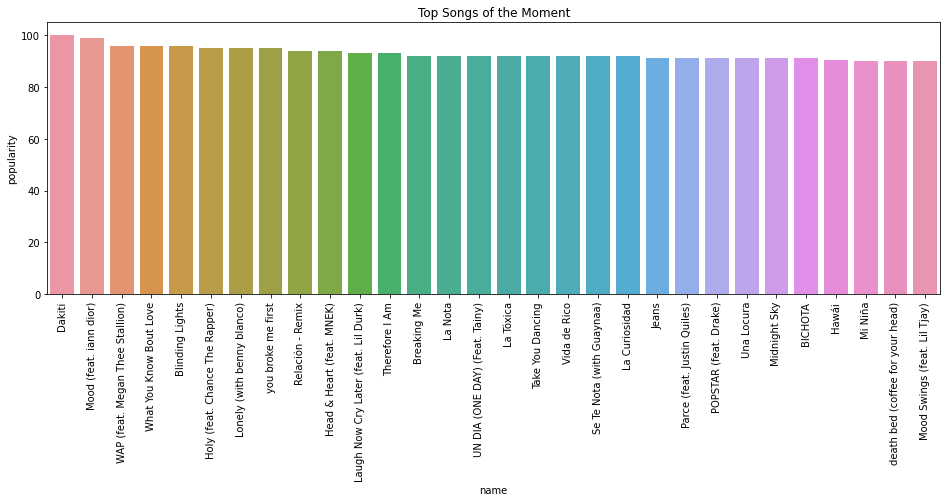

In [23]:
# Dataset with top hit musics
top_hit_music = df3.groupby('name')[['popularity']].mean().reset_index()
top_hit_music = top_hit_music.sort_values(by='popularity', ascending=False).head(30)

# Ploting
plt.figure(figsize=(16,5))
sns.barplot(data=top_hit_music, x='name', y='popularity')
plt.title('Top Songs of the Moment')
plt.xticks(rotation=90)
plt.show()

### 4.3.3. Top famous artist

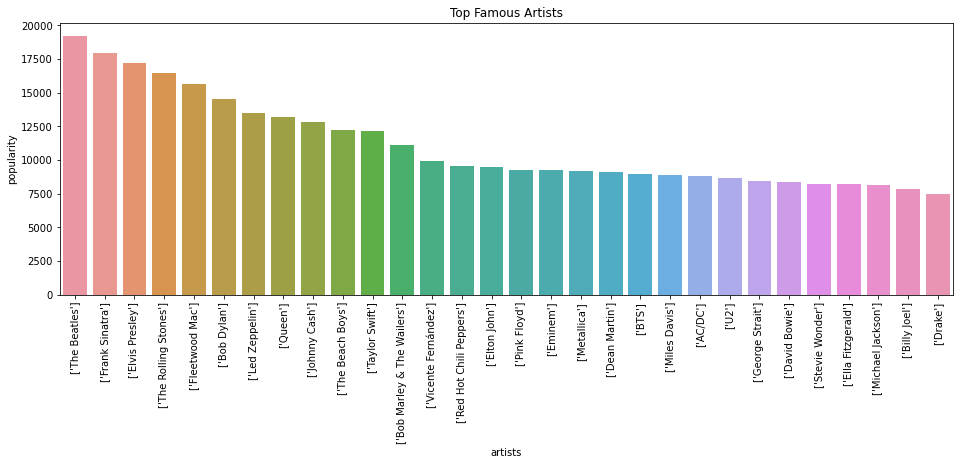

In [24]:
# Dataset with actual top artists
top_hit_artists = df3.groupby('artists')[['popularity']].sum().reset_index()
top_hit_artists = top_hit_artists.sort_values(by='popularity', ascending=False).head(30)

# Ploting
plt.figure(figsize=(16,5))
sns.barplot(data=top_hit_artists, x='artists', y='popularity')
plt.title('Top Famous Artists')
plt.xticks(rotation=90)
plt.show()

### 4.3.4. Top famous song

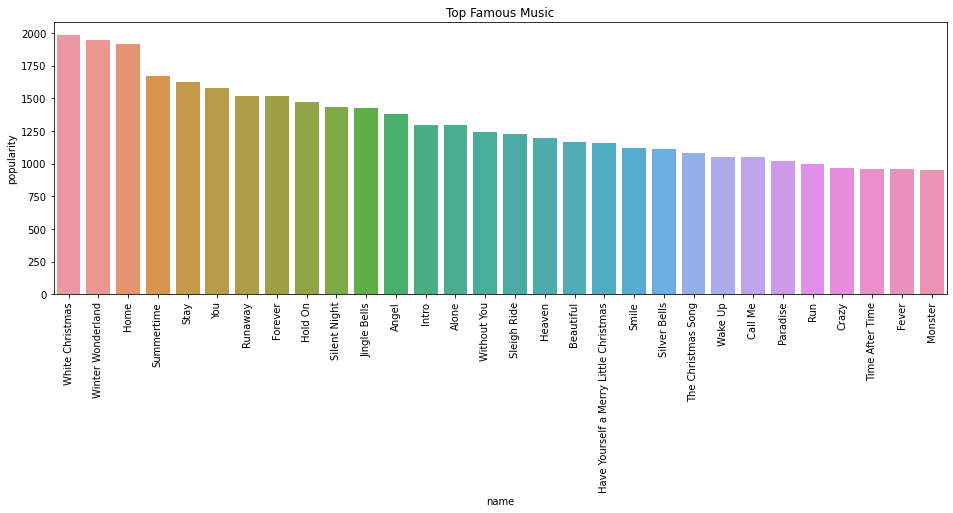

In [25]:
# Dataset with top hit musics
top_hit_music = df3.groupby('name')[['popularity']].sum().reset_index()
top_hit_music = top_hit_music.sort_values(by='popularity', ascending=False).head(30)

# Ploting
plt.figure(figsize=(16,5))
sns.barplot(data=top_hit_music, x='name', y='popularity')
plt.title('Top Famous Music')
plt.xticks(rotation=90)
plt.show()

## 4.4. Bivariate Analysis
The bivariate analysis consists of the independent variable analysis with respect to the dependent variable (target). It can be divided into two perspectives:

1. Hypothesis validation or rejection - is it possible to generate an insight?
2. Is the independent variable relevant for the model?

The following analysis and graphs were made based on the hypothesis list previously issued.

### H1. Popularity occour with high `acousticness`.
### FALSE

In [ ]:
# Check Help Function session
relashionship_h(df3, 'popularity', 'acousticness')

2. Popularity occour with high `danceability`.

In [ ]:
relashionship_h(df3, 'popularity', 'danceability')

3. Popularity occour with 80% of `liveness`.

In [ ]:
relashionship_h(df3, 'popularity', 'liveness')

4. Popularity occour with `loudness` above -10.

In [ ]:
relashionship_h(df3, 'popularity', 'loudness')

5. Popularity occour with low `energy`.

In [ ]:
relashionship_h(df3, 'popularity', 'energy')

6. Popularity occour with low `speechiness`.

In [ ]:
relashionship_h(df3, 'popularity', 'speechiness')

7. Popularity occour with high `valence`.

In [ ]:
relashionship_h(df3, 'popularity', 'valence')

8. Popularity occour with `key` equal 2.

In [ ]:
relashionship_h(df3, 'popularity', 'key')

9. Popularity occour with `mode` equal 1.

In [ ]:
relashionship_h(df3, 'popularity', 'mode')

10. Popularity occour with high `tempo`.

In [ ]:
relashionship_h(df3, 'popularity', 'tempo' )

11. Popularity occour with low `instrumentalness`.

In [ ]:
relashionship_h(df3, 'popularity', 'instrumentalness')

12. Popularity occour with `explicit` equal 1.

In [ ]:
relashionship_h(df3, 'popularity', 'explicit')

13. Popularity occour with high `duration_min`.

In [ ]:
relashionship_h(df3, 'popularity','duration_min' )

## 4.5. Multivariate Analysis
The main goal of the multivariate analysis is to check how variables are related. This is important because it can show the variables with strong or weak relation. The weak ones can later be removed in order to reduce the dataset dimensionality, hence reduce model’s complexity.

### 4.5.1. Numerical Variables

### 4.5.2. Categorical Variables

# 5.0. Data Preparation
Most of the Data Science problems, and this one is also included, have many different sorts of values in the dataset, which represents different range of values. For example, the variable month have a range from 1 to 12, while the competition distance variable has values up to 200000. That can difficult the machine learning training. Furthermore, the categorical variables are in most of the cases with text information, which the machine learning algorithm cannot interpret. To solve this is issue, the data must be prepared (a.k.a. preprocessed) so that the machine learning model can properly train and deliver high performance results.

There are mainly three types of data preparation:

- **Normalization:** Rescale the center (mean) to zero with standard deviation of 1, usually applied for variables with a normal, Gaussian distribution;
- **Rescaling:** Rescale the numerical variable to a range between 0 and 1, normally applied for variables without a Gaussian distribution;
- Transformation:
  - Conversion of categorical variables to numerical (Encoding);
  - Nature transformation for variables with cyclic nature (for example months of the year);
  - Logarithm transformation.

## 5.1. Rescaling

## 5.2. Transformation

# 6.0. Feature Selection

# 7.0. Machine Learning Modelling

# 8.0. Fine Tuning 
The hyperparameter fine-tuning is performed in order to improve the model performance in comparison to the model with default hyperparameters.

There are two ways to perform hyperparameter fine-tuning: through grid search or through random search. In grid search all predefined hyperparameters are combined and evaluated through cross-validation. It is the best way to find the best hyperparameters combinations, however it takes a long time to be completed. In random search, the predefined hyperparameters are randomly combined and then evaluated through cross-validation. It may not find the best optimal combination, however it is much faster than the grid search and it is largely applied.

In this project, the sklearn's RandomizedSearchCV was initially applied, however it did not work as expected and therefore was not able to complete the task. Hence, the code lines were removed in order to keep the functional script in the notebook. This problem is probably due to: 1. the size of the dataset and 2. The computer memory.

As the random search executes a cross-validation for each iterations (i.e., for each random hyperparameter combination), the execution and values are stored in the RAM memory, which due to the size of the dataset cannot afford all these steps. Hence, in order to experiment other hyperparameter combinations rather than the default one, three combinations were randomly set and evaluated on the test set, as shown below.

# 10.0. Business Performance and Results